In [4]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report


from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Activation,Dropout,Conv2D, MaxPooling2D,BatchNormalization, Flatten,Input
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras.callbacks import ModelCheckpoint
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import os
import seaborn as sns
sns.set_style('darkgrid')
from sklearn.metrics import confusion_matrix, classification_report
from IPython.display import display, HTML

In [2]:
sdir=r'sibilang'


filepaths=[]
labels=[]
classlist=os.listdir(sdir)
for klass in classlist:
    classpath=os.path.join(sdir,klass)
    if os.path.isdir(classpath):
        flist=os.listdir(classpath)
        for f in flist:
            fpath=os.path.join(classpath,f)
            filepaths.append(fpath)
            labels.append(klass)                   
Fseries= pd.Series(filepaths, name='filepaths')
Lseries=pd.Series(labels, name='labels')    
df=pd.concat([Fseries, Lseries], axis=1)
print (df.head())
print (df['labels'].value_counts())

                           filepaths labels
0  sibilang\A\1645707869.4431655.jpg      A
1  sibilang\A\1645707871.4600735.jpg      A
2  sibilang\A\1645707873.4433305.jpg      A
3   sibilang\A\1645707875.362499.jpg      A
4  sibilang\A\1645707878.1629865.jpg      A
A    220
B    220
X    220
W    220
V    220
U    220
T    220
S    220
R    220
Q    220
P    220
O    220
N    220
M    220
L    220
K    220
I    220
H    220
G    220
F    220
E    220
D    220
C    220
Y    220
Name: labels, dtype: int64


In [3]:
train_split=.8
test_split=.1
dummy_split=test_split/(1-train_split)
train_df, dummy_df=train_test_split(df, train_size=train_split, shuffle=True, random_state=123)
test_df, valid_df=train_test_split(dummy_df, train_size=dummy_split, shuffle=True, random_state=123)
print ('train_df length: ', len(train_df), '  test_df length: ', len(test_df), '  valid_df length: ', len(valid_df))

train_df length:  4224   test_df length:  528   valid_df length:  528


In [4]:
height=150
width=150
channels=3
batch_size=64

img_shape=(height, width, channels)
img_size=(height, width)
length=len(test_df)
test_batch_size=sorted([int(length/n) for n in range(1,length+1) if length % n ==0 and length/n<=80],reverse=True)[0]  
test_steps=int(length/test_batch_size)
print ( 'test batch size: ' ,test_batch_size, '  test steps: ', test_steps)

gen = ImageDataGenerator(
    rescale=1./255,
    fill_mode='nearest'
)
train_gen=gen.flow_from_dataframe( train_df, 
                                  x_col='filepaths', 
                                  y_col='labels', 
                                  target_size=img_size, 
                                  class_mode='categorical',
                                  color_mode='rgb', 
                                  shuffle=True, 
                                  batch_size=batch_size)

validgen=ImageDataGenerator(rescale=1./255)
valid_gen=validgen.flow_from_dataframe( valid_df, x_col='filepaths', y_col='labels', target_size=img_size, class_mode='categorical',
                                    color_mode='rgb', shuffle=True, batch_size=batch_size)

testgen=ImageDataGenerator(rescale=1./255)
test_gen=testgen.flow_from_dataframe( test_df, x_col='filepaths', y_col='labels', target_size=img_size, class_mode='categorical',
                                    color_mode='rgb', shuffle=False, batch_size=test_batch_size)

classes=list(train_gen.class_indices.keys())
print (classes)
class_count=len(classes)

test batch size:  66   test steps:  8
Found 4224 validated image filenames belonging to 24 classes.
Found 528 validated image filenames belonging to 24 classes.
Found 528 validated image filenames belonging to 24 classes.
['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y']


In [5]:
def show_image_samples(gen):
    test_dict=test_gen.class_indices
    classes=list(test_dict.keys())    
    images,labels=next(gen) # get a sample batch from the generator 
    plt.figure(figsize=(20, 20))
    length=len(labels)
    if length<25:   #show maximum of 25 images
        r=length
    else:
        r=25
    for i in range(r):
        plt.subplot(5, 5, i + 1)
        image=images[i]
        plt.imshow(image)
        index=np.argmax(labels[i])
        class_name=classes[index]
        plt.title(class_name, color='blue', fontsize=16)
        plt.axis('off')
    plt.show()

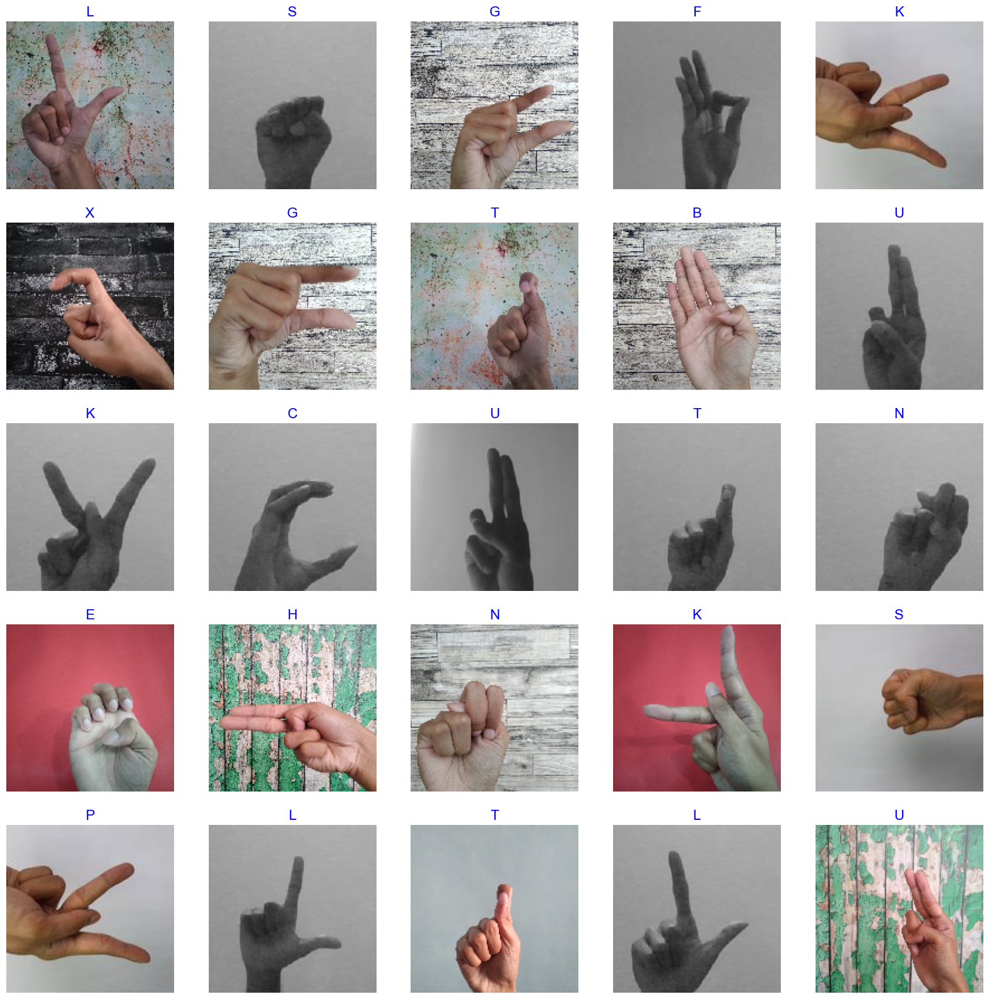

In [6]:
show_image_samples(train_gen)

In [7]:
base_model = keras.applications.MobileNetV2(
    weights='imagenet',
    include_top=False,
    input_shape=img_shape
)

In [8]:
base_model.trainable = False

In [9]:
print("Building model with", base_model)
model = tf.keras.Sequential([
            base_model,
            tf.keras.layers.Conv2D(512, (3, 3), activation='relu',padding='same'),
            tf.keras.layers.MaxPooling2D(2, 2),
            tf.keras.layers.Conv2D(512, (3, 3), activation='relu',padding='same'),
            tf.keras.layers.MaxPooling2D(2, 2),
    
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(512, activation='relu'),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(24, activation='softmax')])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=.0001), loss='categorical_crossentropy', metrics='accuracy')

Building model with <keras.engine.functional.Functional object at 0x000002351EEA4BE0>


In [10]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 5, 5, 1280)       2257984   
 ional)                                                          
                                                                 
 conv2d (Conv2D)             (None, 5, 5, 512)         5898752   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 2, 2, 512)        0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 2, 2, 512)         2359808   
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 1, 1, 512)        0         
 2D)                                                             
                                                        

In [11]:
epochs =10 
history=model.fit(x=train_gen, epochs=epochs, validation_data=valid_gen)

Epoch 1/10
66/66 [==============================] - 331s 5s/step - loss: 1.7716 - accuracy: 0.4953 - val_loss: 0.6551 - val_accuracy: 0.8125
Epoch 2/10
66/66 [==============================] - 250s 4s/step - loss: 0.4482 - accuracy: 0.8603 - val_loss: 0.3594 - val_accuracy: 0.8807
Epoch 3/10
66/66 [==============================] - 235s 4s/step - loss: 0.2250 - accuracy: 0.9358 - val_loss: 0.2643 - val_accuracy: 0.9223
Epoch 4/10
66/66 [==============================] - 301s 5s/step - loss: 0.1194 - accuracy: 0.9657 - val_loss: 0.2521 - val_accuracy: 0.9205
Epoch 5/10
66/66 [==============================] - 262s 4s/step - loss: 0.0775 - accuracy: 0.9818 - val_loss: 0.2138 - val_accuracy: 0.9299
Epoch 6/10
66/66 [==============================] - 248s 4s/step - loss: 0.0427 - accuracy: 0.9912 - val_loss: 0.1470 - val_accuracy: 0.9451
Epoch 7/10
66/66 [==============================] - 237s 4s/step - loss: 0.0314 - accuracy: 0.9941 - val_loss: 0.1337 - val_accuracy: 0.9508
Epoch 8/10
66

In [12]:
def print_in_color(txt_msg,fore_tupple,back_tupple,):
    #prints the text_msg in the foreground color specified by fore_tupple with the background specified by back_tupple 
    #text_msg is the text, fore_tupple is foregroud color tupple (r,g,b), back_tupple is background tupple (r,g,b)
    rf,gf,bf=fore_tupple
    rb,gb,bb=back_tupple
    msg='{0}' + txt_msg
    mat='\33[38;2;' + str(rf) +';' + str(gf) + ';' + str(bf) + ';48;2;' + str(rb) + ';' +str(gb) + ';' + str(bb) +'m' 
    print(msg .format(mat), flush=True)
    print('\33[0m', flush=True) # returns default print color to back to black
    return

In [13]:
def tr_plot(tr_data, start_epoch):
    #Plot the training and validation data
    tacc=tr_data.history['accuracy']
    tloss=tr_data.history['loss']
    vacc=tr_data.history['val_accuracy']
    vloss=tr_data.history['val_loss']
    Epoch_count=len(tacc)+ start_epoch
    Epochs=[]
    for i in range (start_epoch ,Epoch_count):
        Epochs.append(i+1)   
    index_loss=np.argmin(vloss)#  this is the epoch with the lowest validation loss
    val_lowest=vloss[index_loss]
    index_acc=np.argmax(vacc)
    acc_highest=vacc[index_acc]
    plt.style.use('fivethirtyeight')
    sc_label='best epoch= '+ str(index_loss+1 +start_epoch)
    vc_label='best epoch= '+ str(index_acc + 1+ start_epoch)
    fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(20,8))
    axes[0].plot(Epochs,tloss, 'r', label='Training loss')
    axes[0].plot(Epochs,vloss,'g',label='Validation loss' )
    axes[0].scatter(index_loss+1 +start_epoch,val_lowest, s=150, c= 'blue', label=sc_label)
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[1].plot (Epochs,tacc,'r',label= 'Training Accuracy')
    axes[1].plot (Epochs,vacc,'g',label= 'Validation Accuracy')
    axes[1].scatter(index_acc+1 +start_epoch,acc_highest, s=150, c= 'blue', label=vc_label)
    axes[1].set_title('Training and Validation Accuracy')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Accuracy')
    axes[1].legend()
    plt.tight_layout
    #plt.style.use('fivethirtyeight')
    plt.show()

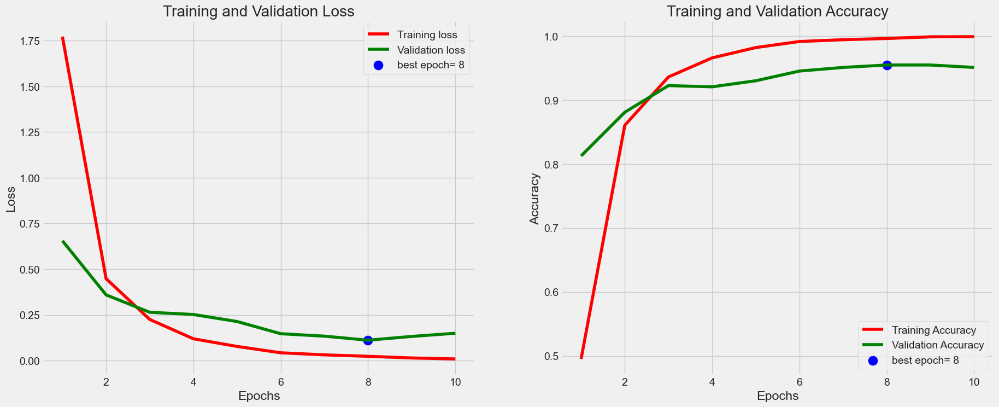

8/8 [==============================] - 27s 4s/step - loss: 0.1280 - accuracy: 0.9527
accuracy on the test set is 95.27 %



In [14]:
model_name = 'mobilenetv2_10_2'
tr_plot(history,0)
save_dir=r'./'
subject='Sign Language SIBI MobileNetV2'
acc=model.evaluate( test_gen, batch_size=test_batch_size, verbose=1, steps=test_steps, return_dict=False)[1]*100
msg=f'accuracy on the test set is {acc:5.2f} %'
print_in_color(msg, (0,255,0),(55,65,80))
save_id=str (model_name +  '-' + subject +'-'+ str(acc)[:str(acc).rfind('.')+3] + '.h5')
save_loc=os.path.join(save_dir, save_id)
model.save(save_loc)

In [15]:
def print_info( test_gen, preds, print_code, save_dir, subject ):
    class_dict=test_gen.class_indices
    labels= test_gen.labels
    file_names= test_gen.filenames 
    error_list=[]
    true_class=[]
    pred_class=[]
    prob_list=[]
    new_dict={}
    error_indices=[]
    y_pred=[]
    for key,value in class_dict.items():
        new_dict[value]=key             # dictionary {integer of class number: string of class name}
    # store new_dict as a text fine in the save_dir
    classes=list(new_dict.values())     # list of string of class names
    dict_as_text=str(new_dict)
    dict_name= subject + '-' +str(len(classes)) +'.txt'  
    dict_path=os.path.join(save_dir,dict_name)    
    with open(dict_path, 'w') as x_file:
        x_file.write(dict_as_text)    
    errors=0      
    for i, p in enumerate(preds):
        pred_index=np.argmax(p)        
        true_index=labels[i]  # labels are integer values
        if pred_index != true_index: # a misclassification has occurred
            error_list.append(file_names[i])
            true_class.append(new_dict[true_index])
            pred_class.append(new_dict[pred_index])
            prob_list.append(p[pred_index])
            error_indices.append(true_index)            
            errors=errors + 1
        y_pred.append(pred_index)    
    if print_code !=0:
        if errors>0:
            if print_code>errors:
                r=errors
            else:
                r=print_code           
            msg='{0:^28s}{1:^28s}{2:^28s}{3:^16s}'.format('Filename', 'Predicted Class' , 'True Class', 'Probability')
            print_in_color(msg, (0,255,0),(55,65,80))
            for i in range(r):                
                split1=os.path.split(error_list[i])                
                split2=os.path.split(split1[0])                
                fname=split2[1] + '/' + split1[1]
                msg='{0:^28s}{1:^28s}{2:^28s}{3:4s}{4:^6.4f}'.format(fname, pred_class[i],true_class[i], ' ', prob_list[i])
                print_in_color(msg, (255,255,255), (55,65,60))
                #print(error_list[i]  , pred_class[i], true_class[i], prob_list[i])               
        else:
            msg='With accuracy of 100 % there are no errors to print'
            print_in_color(msg, (0,255,0),(55,65,80))
    if errors>0:
        plot_bar=[]
        plot_class=[]
        for  key, value in new_dict.items():        
            count=error_indices.count(key) 
            if count!=0:
                plot_bar.append(count) # list containg how many times a class c had an error
                plot_class.append(value)   # stores the class 
        fig=plt.figure()
        fig.set_figheight(len(plot_class)/3)
        fig.set_figwidth(10)
        plt.style.use('fivethirtyeight')
        for i in range(0, len(plot_class)):
            c=plot_class[i]
            x=plot_bar[i]
            plt.barh(c, x, )
            plt.title( ' Errors by Class on Test Set')
    y_true= np.array(labels)        
    y_pred=np.array(y_pred)
    if len(classes)<= 30:
        # create a confusion matrix 
        cm = confusion_matrix(y_true, y_pred )        
        length=len(classes)
        if length<8:
            fig_width=8
            fig_height=8
        else:
            fig_width= int(length * .5)
            fig_height= int(length * .5)
        plt.figure(figsize=(fig_width, fig_height))
        sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)       
        plt.xticks(np.arange(length)+.5, classes, rotation= 90)
        plt.yticks(np.arange(length)+.5, classes, rotation=0)
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title("Confusion Matrix")
        plt.show()
    clr = classification_report(y_true, y_pred, target_names=classes)
    print("Classification Report:\n----------------------\n", clr)

8/8 [==============================] - 22s 2s/step


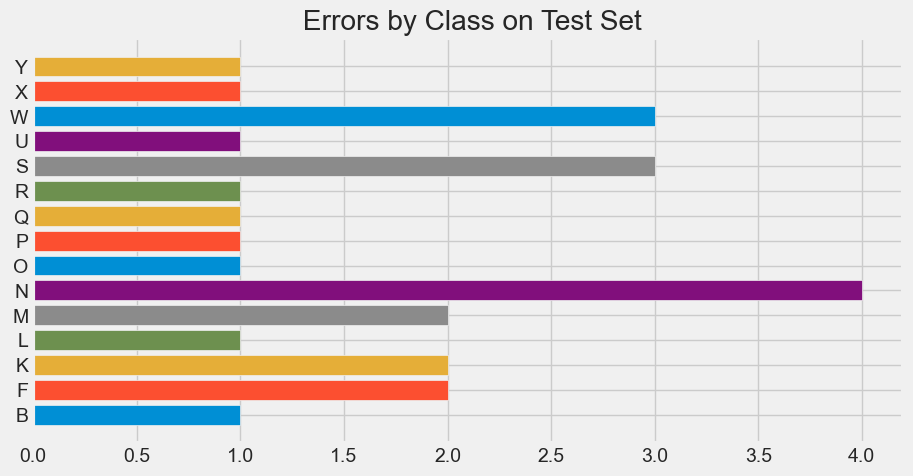

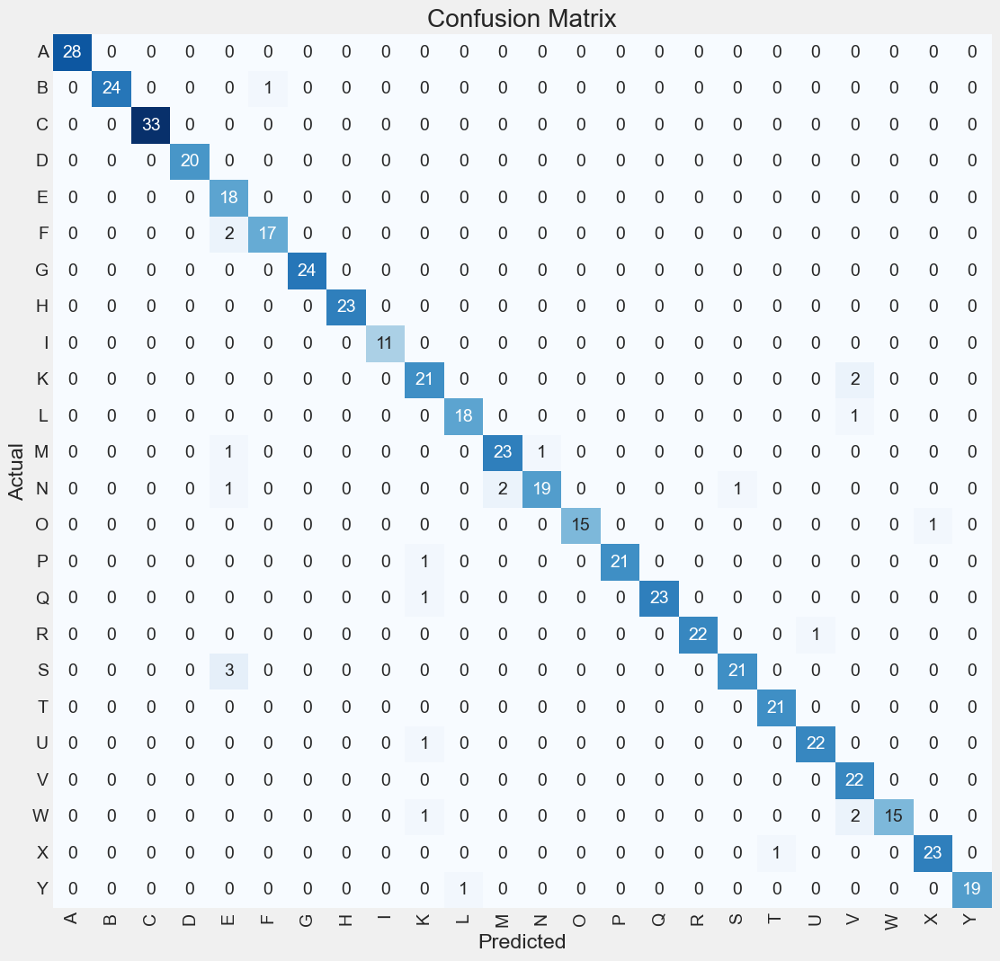

Classification Report:
----------------------
               precision    recall  f1-score   support

           A       1.00      1.00      1.00        28
           B       1.00      0.96      0.98        25
           C       1.00      1.00      1.00        33
           D       1.00      1.00      1.00        20
           E       0.72      1.00      0.84        18
           F       0.94      0.89      0.92        19
           G       1.00      1.00      1.00        24
           H       1.00      1.00      1.00        23
           I       1.00      1.00      1.00        11
           K       0.84      0.91      0.87        23
           L       0.95      0.95      0.95        19
           M       0.92      0.92      0.92        25
           N       0.95      0.83      0.88        23
           O       1.00      0.94      0.97        16
           P       1.00      0.95      0.98        22
           Q       1.00      0.96      0.98        24
           R       1.00      0.96 

In [16]:
print_code=0
preds=model.predict(test_gen) 
print_info( test_gen, preds, print_code, save_dir, subject )  

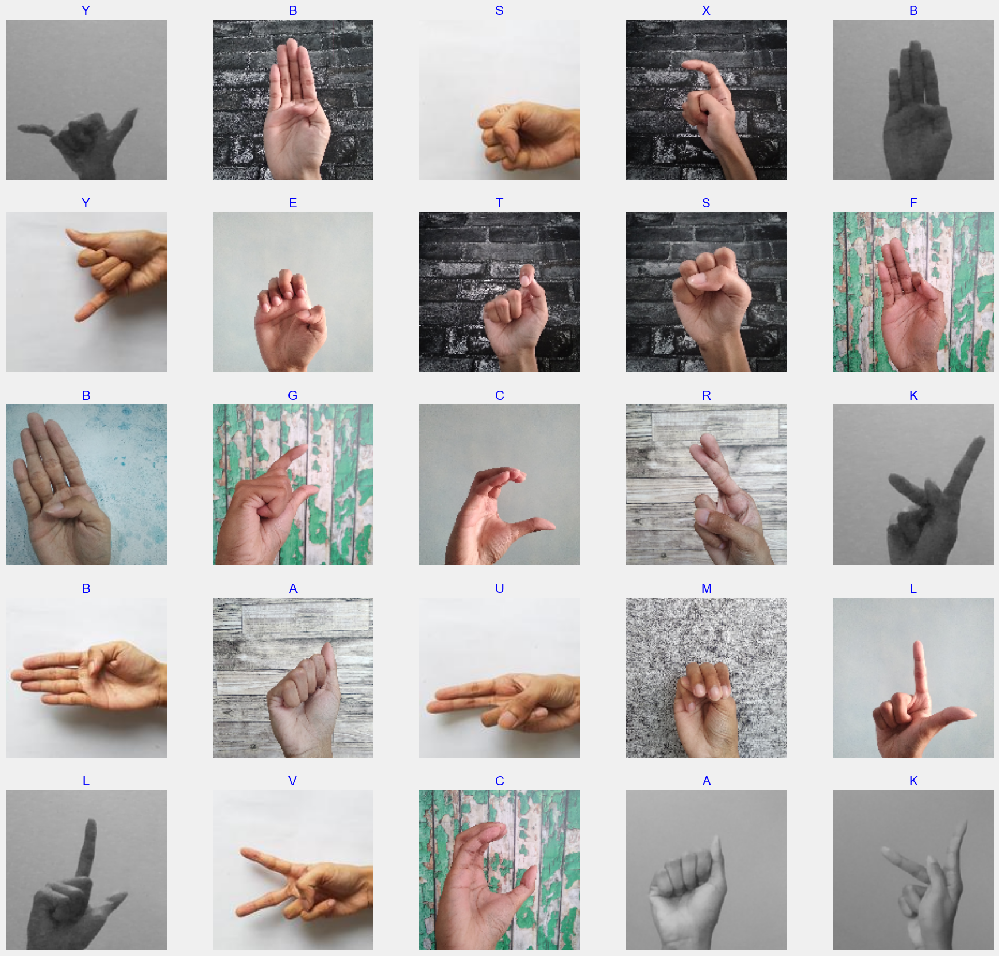

In [17]:
show_image_samples(test_gen)

In [14]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
model = load_model('sequential_50-Sign Language SIBI MobileNetV2-80.87.h5')
labels =  {
        0 : "A",
        1 : "B",
        2 : "C",
        3 : "D",
        4 : "E",
        5 : "F",
        6 : "G",
        7 : "H",
        8 : "I",
        9 : "K",
        10 : "L",
        11 : "M",
        12 : "N",
        13 : "O",
        14 : "P",
        15 : "Q",
        16 : "R",
        17 : "S",
        18 : "T",
        19 : "U",
        20 : "V",
        21 : "W",
        22 : "X",
        23 : "Y",
        
    }



model.make_predict_function()

def predict_label(img_path):
    i = image.load_img(img_path, target_size=(150, 150))
    i = image.img_to_array(i) / 255.0
    i = i.reshape(1, 150, 150, 3)
    probabilities = model.predict(i)
    predicted_class = np.argmax(probabilities, axis=1)
    return labels[predicted_class[0]]


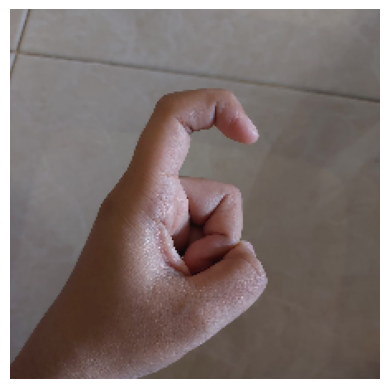

1/1 [==============================] - 0s 91ms/step
Predicted Label: C


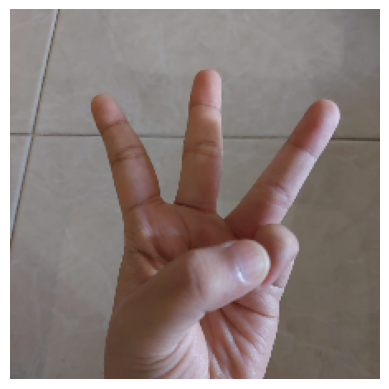

1/1 [==============================] - 0s 31ms/step
Predicted Label: W


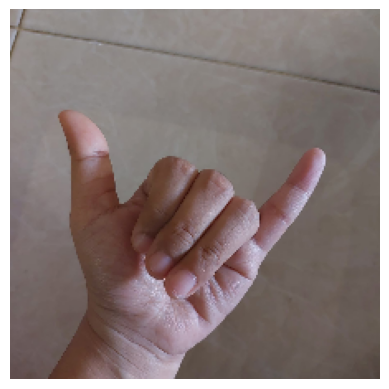

1/1 [==============================] - 0s 30ms/step
Predicted Label: G


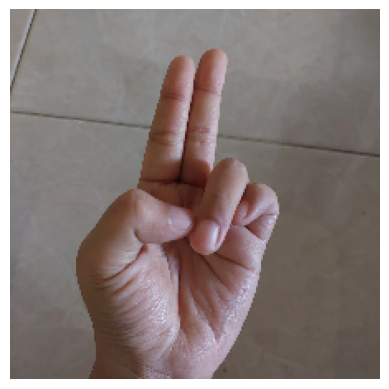

1/1 [==============================] - 0s 40ms/step
Predicted Label: Q


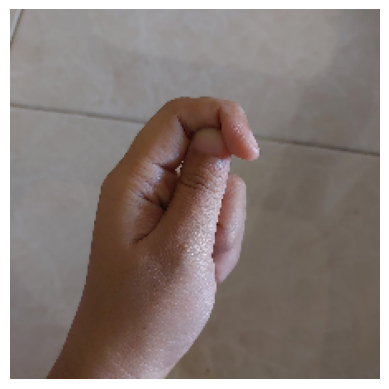

1/1 [==============================] - 0s 61ms/step
Predicted Label: C


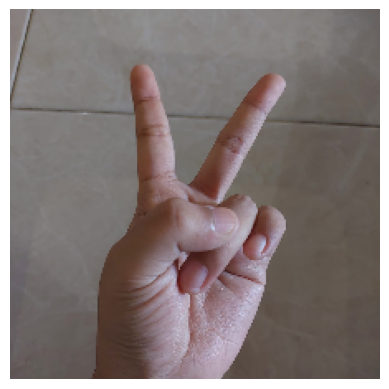

1/1 [==============================] - 0s 30ms/step
Predicted Label: W


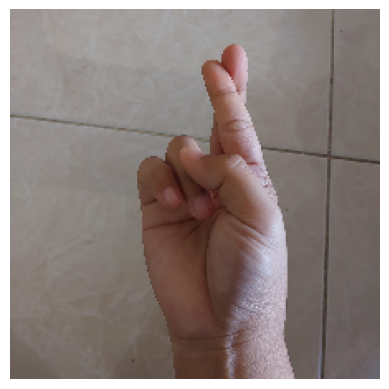

1/1 [==============================] - 0s 43ms/step
Predicted Label: F


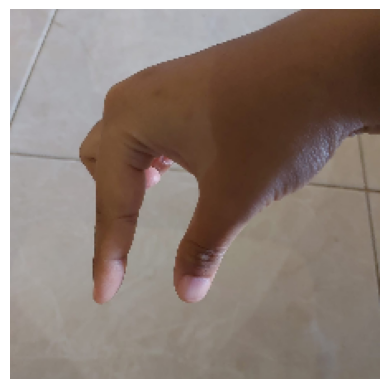

1/1 [==============================] - 0s 34ms/step
Predicted Label: Q


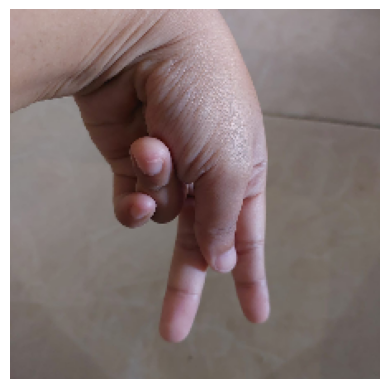

1/1 [==============================] - 0s 38ms/step
Predicted Label: Q


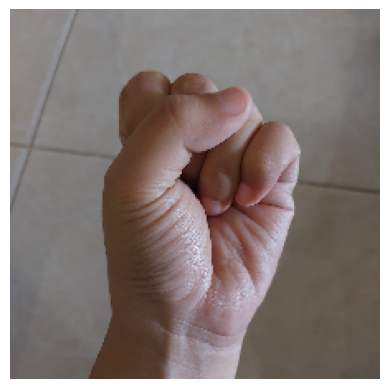

1/1 [==============================] - 0s 55ms/step
Predicted Label: Q


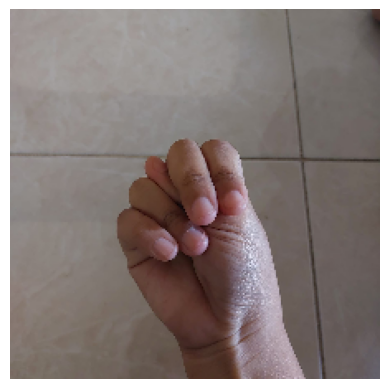

1/1 [==============================] - 0s 32ms/step
Predicted Label: A


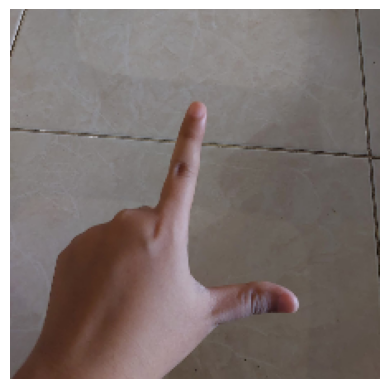

1/1 [==============================] - 0s 29ms/step
Predicted Label: C


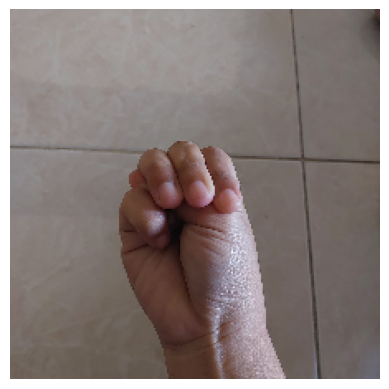

1/1 [==============================] - 0s 22ms/step
Predicted Label: O


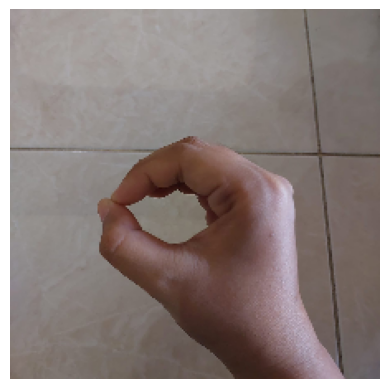

1/1 [==============================] - 0s 24ms/step
Predicted Label: O


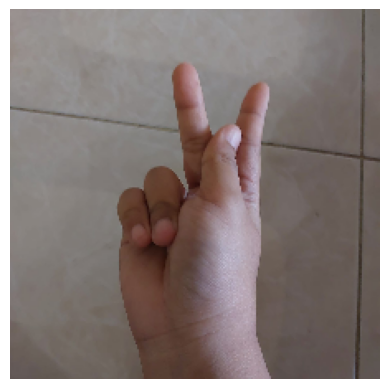

1/1 [==============================] - 0s 31ms/step
Predicted Label: K


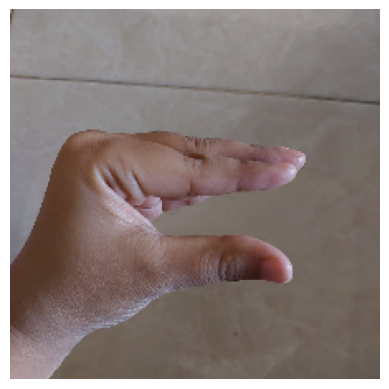

1/1 [==============================] - 0s 26ms/step
Predicted Label: G


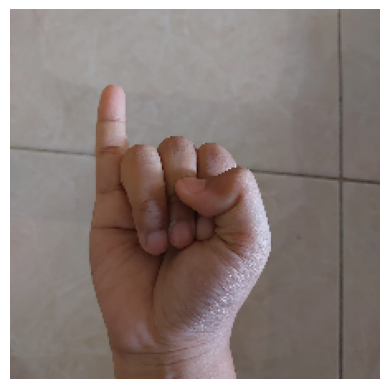

1/1 [==============================] - 0s 36ms/step
Predicted Label: I


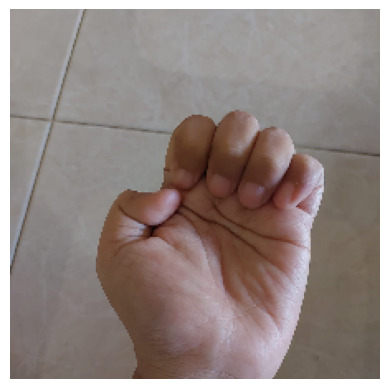

1/1 [==============================] - 0s 23ms/step
Predicted Label: N


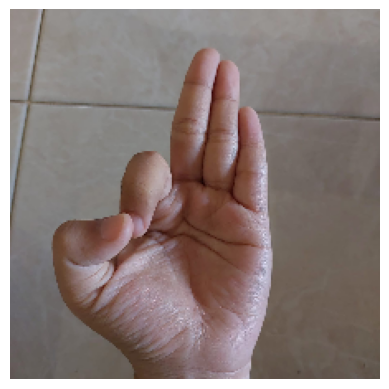

1/1 [==============================] - 0s 29ms/step
Predicted Label: N


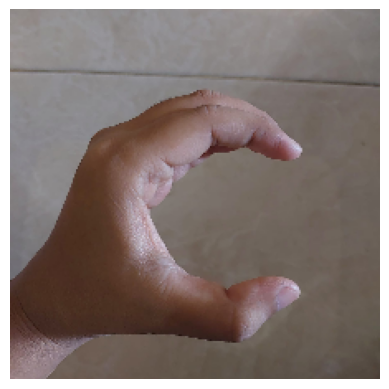

1/1 [==============================] - 0s 24ms/step
Predicted Label: C


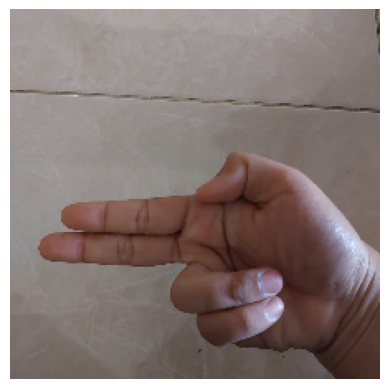

1/1 [==============================] - 0s 33ms/step
Predicted Label: D


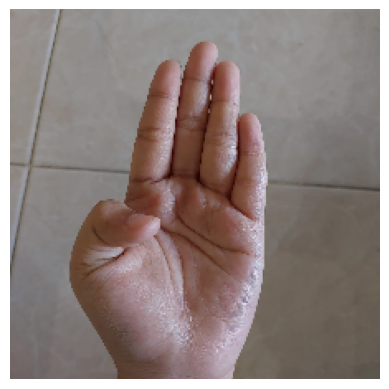

1/1 [==============================] - 0s 29ms/step
Predicted Label: Q


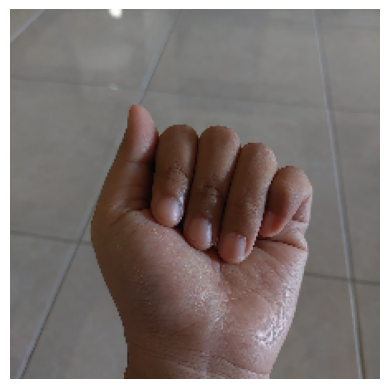

1/1 [==============================] - 0s 34ms/step
Predicted Label: A


In [15]:
for i in range (1,24):
    img_path = f'test/test/test/{i}.jpeg'
    img = image.load_img(img_path, target_size=(224, 224))
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    predicted_label = predict_label(img_path)
    print("Predicted Label:", predicted_label)

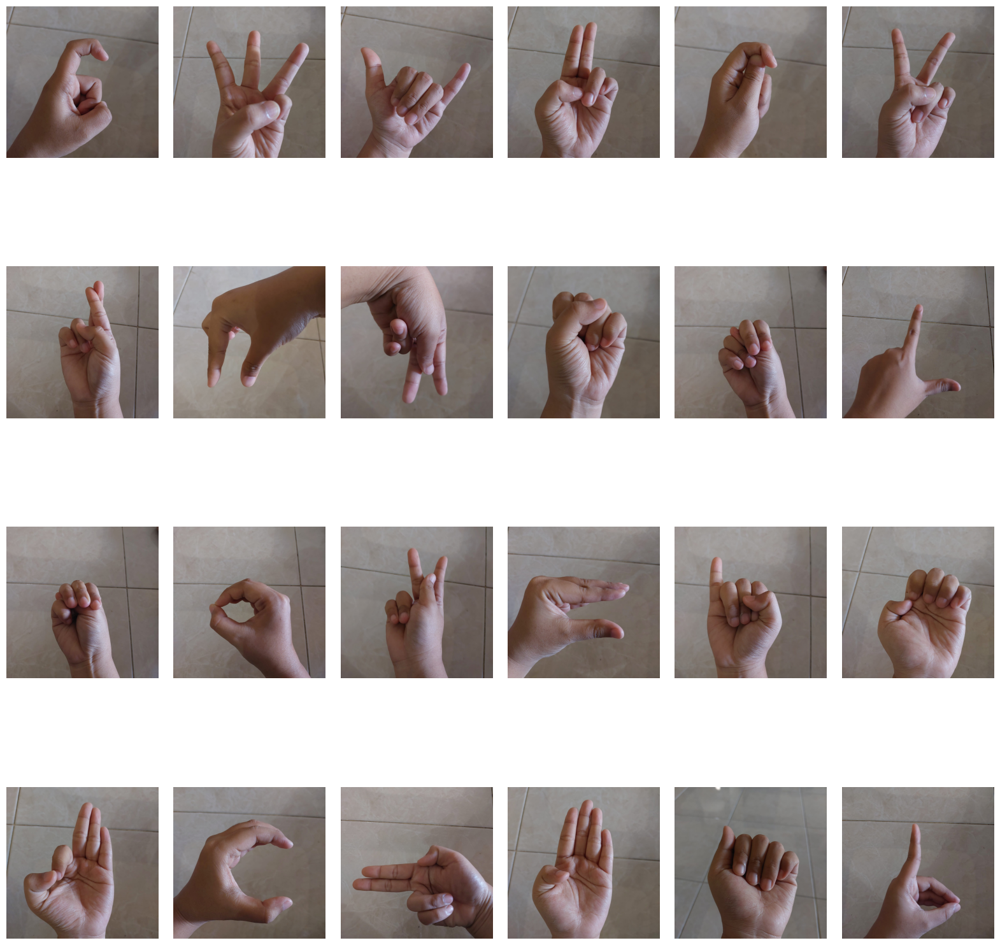

In [1]:
import os
import matplotlib.pyplot as plt
import cv2

def show_all_images_in_folder(folder_path):
    num_cols = 6  # Number of columns in the grid
    plt.figure(figsize=(20, 20))
    image_files = [filename for filename in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, filename))
                   and filename.lower().endswith(('.png', '.jpg', '.jpeg', '.gif'))]
    
    num_images = len(image_files)
    
    for i, filename in enumerate(image_files):
        file_path = os.path.join(folder_path, filename)
        image = cv2.imread(file_path)
        if image is not None:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB (matplotlib uses RGB)
            plt.subplot((num_images + num_cols - 1) // num_cols, num_cols, i + 1)
            plt.imshow(image)
            plt.axis('off')

    # Remove any extra empty subplots
    for i in range(num_images, num_cols * ((num_images + num_cols - 1) // num_cols)):
        plt.subplot((num_images + num_cols - 1) // num_cols, num_cols, i + 1)
        plt.axis('off')

    plt.subplots_adjust(wspace=0.1, hspace=0.3)  # Adjust spacing between rows and columns
    plt.show()

# Define the folder path where the images are located
folder_path = "test/test/test"

# Display all the images from the folder
show_all_images_in_folder(folder_path)
